In [1]:
#Importing required libraries
from urllib.request import urlopen
from bs4 import BeautifulSoup

In [2]:
#Method to get all blog - posts from a specific Url
def getAllPosts(url,links):
    print(url)
    soup = BeautifulSoup(urlopen(url))
    for a in soup.findAll('a',{"class":"next page-numbers"}):
        try:
            url = a['href']
            links.append(url)
            getAllPosts(url,links)
        except:
            break
    return

blogUrl = "https://www.jagoinvestor.com/"
links = [blogUrl]
getAllPosts(blogUrl,links)

https://www.jagoinvestor.com/
https://www.jagoinvestor.com/page/2
https://www.jagoinvestor.com/page/3
https://www.jagoinvestor.com/page/4
https://www.jagoinvestor.com/page/5
https://www.jagoinvestor.com/page/6
https://www.jagoinvestor.com/page/7
https://www.jagoinvestor.com/page/8
https://www.jagoinvestor.com/page/9
https://www.jagoinvestor.com/page/10
https://www.jagoinvestor.com/page/11
https://www.jagoinvestor.com/page/12
https://www.jagoinvestor.com/page/13
https://www.jagoinvestor.com/page/14
https://www.jagoinvestor.com/page/15
https://www.jagoinvestor.com/page/16
https://www.jagoinvestor.com/page/17
https://www.jagoinvestor.com/page/18
https://www.jagoinvestor.com/page/19
https://www.jagoinvestor.com/page/20
https://www.jagoinvestor.com/page/21
https://www.jagoinvestor.com/page/22
https://www.jagoinvestor.com/page/23
https://www.jagoinvestor.com/page/24
https://www.jagoinvestor.com/page/25
https://www.jagoinvestor.com/page/26
https://www.jagoinvestor.com/page/27
https://www.jago

In [135]:
#Method to get text from each Url
def getText(url):
    soup = BeautifulSoup(urlopen(url))
    divs = soup.findAll("div", {"class":"post-on-blog"})
    posts = []
    for div in divs:
        try:
            soup_new = BeautifulSoup(urlopen(div.find('a')['href']))
            div_child = soup_new.find("div", {"class":"blog-details-p"})
            para = div_child.find_all('p')
            para_text = []
            for p in para:
                if p.text != "":
                    para_text+=''.join(p.text)
            posts.append(''.join(para_text))
        except:
            print("error: div:",div.find('a')['href'])
    return posts

In [137]:
#Creating a list of posts by appending text from each link
posts = []
for link in links:
    posts.append(getText(link))

error: div: https://www.jagoinvestor.com/2013/08/financial-planning-example.html


In [141]:
posts

[['This is a long, but intense and immensely high-value article. So please read it fully!Today I want to talk about some of the advantages of “doing a job”, rather than running a business or being an entrepreneur.If you are someone who thinks that having your own business is “always” better than “doing a job”, I want to break your myth and point out several things which people don’t appreciate about doing a job.There are lots of articles, videos, and podcasts about “leaving your job to pursue passion” and in almost all of them, a “job” is projected as some kind of modern slavery. It projects “doing the job” as working for someone else success and giving your life for others’ benefit.I think it’s a gross over-exaggeration and while the job has its own limitations and issues, being your own boss has its own share of very big problems. I have also seen many salaried people complaining about their life, work culture, pay limitation, lack of opportunities, and their declaration about how th

In [142]:
#Joining posts of different div elements present on each link to create an one dimensional list of posts
concatenated_posts = ["\n".join(post) for post in posts]
concatenated_posts

['This is a long, but intense and immensely high-value article. So please read it fully!Today I want to talk about some of the advantages of “doing a job”, rather than running a business or being an entrepreneur.If you are someone who thinks that having your own business is “always” better than “doing a job”, I want to break your myth and point out several things which people don’t appreciate about doing a job.There are lots of articles, videos, and podcasts about “leaving your job to pursue passion” and in almost all of them, a “job” is projected as some kind of modern slavery. It projects “doing the job” as working for someone else success and giving your life for others’ benefit.I think it’s a gross over-exaggeration and while the job has its own limitations and issues, being your own boss has its own share of very big problems. I have also seen many salaried people complaining about their life, work culture, pay limitation, lack of opportunities, and their declaration about how the

In [143]:
#writing posts to a text file
with open('f3.txt','w',encoding='utf-8') as f:
    f.write('\n'.join(concatenated_posts))

In [23]:
#reading back all the posts from text file
lines = []
with open('f3.txt','r',encoding='utf-8') as f:
    lines = f.readlines()

lines

['This is a long, but intense and immensely high-value article. So please read it fully!Today I want to talk about some of the advantages of “doing a job”, rather than running a business or being an entrepreneur.If you are someone who thinks that having your own business is “always” better than “doing a job”, I want to break your myth and point out several things which people don’t appreciate about doing a job.There are lots of articles, videos, and podcasts about “leaving your job to pursue passion” and in almost all of them, a “job” is projected as some kind of modern slavery. It projects “doing the job” as working for someone else success and giving your life for others’ benefit.I think it’s a gross over-exaggeration and while the job has its own limitations and issues, being your own boss has its own share of very big problems. I have also seen many salaried people complaining about their life, work culture, pay limitation, lack of opportunities, and their declaration about how the

In [2]:
#Importing necessary library for vectorization
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords
from string import punctuation

In [3]:
#Instantiating vectorizer
vectorizer = TfidfVectorizer(max_df=0.5,min_df=2,stop_words='english')

In [4]:
#Creating fit transform for text
x = vectorizer.fit_transform(lines)

In [5]:
print(x[0])

  (0, 6446)	0.010880840212347788
  (0, 7776)	0.010087019331856418
  (0, 6903)	0.009318172267769443
  (0, 8489)	0.005298957469525774
  (0, 9564)	0.011228930612748166
  (0, 1964)	0.011082763173544072
  (0, 6965)	0.011469027355537372
  (0, 8644)	0.009722939515490374
  (0, 5301)	0.010638451865701644
  (0, 6610)	0.011739853546065757
  (0, 5086)	0.01241452565898671
  (0, 4982)	0.009760437619335843
  (0, 6957)	0.015960991305505712
  (0, 2575)	0.009722939515490374
  (0, 8914)	0.009257637076385761
  (0, 3757)	0.008009046678749741
  (0, 8579)	0.010271360552653434
  (0, 7850)	0.014492498312093389
  (0, 7044)	0.014165916599572814
  (0, 2697)	0.015960991305505712
  (0, 7671)	0.006721887684111875
  (0, 7513)	0.014878762494086688
  (0, 8305)	0.014492498312093389
  (0, 2580)	0.00991744184717649
  (0, 9534)	0.006910330721406418
  :	:
  (0, 6402)	0.10399031203899224
  (0, 8715)	0.1259803428803713
  (0, 6574)	0.033475351585252965
  (0, 5823)	0.01081759409601433
  (0, 1434)	0.009058428513458523
  (0, 1275

In [6]:
#Importing KMeans
from sklearn.cluster import KMeans

In [7]:
#Instantiating KMeans
km = KMeans(n_clusters=3, init='k-means++', max_iter=100, n_init=1, verbose=True)

In [8]:
#Fitting data w.r.t. KMeans clusters
km.fit(x)

Initialization complete
Iteration 0, inertia 3650.108366799201
Iteration 1, inertia 1858.4615481681567
Iteration 2, inertia 1851.8326138004522
Iteration 3, inertia 1849.4068557799285
Iteration 4, inertia 1848.0947375530998
Iteration 5, inertia 1847.2207395237247
Iteration 6, inertia 1846.6589521777414
Iteration 7, inertia 1846.28363321952
Iteration 8, inertia 1845.990616785281
Iteration 9, inertia 1845.7221518034435
Iteration 10, inertia 1845.3525459660048
Iteration 11, inertia 1845.0161633093712
Iteration 12, inertia 1844.8644700251796
Iteration 13, inertia 1844.768136047159
Iteration 14, inertia 1844.715569491651
Iteration 15, inertia 1844.705503197035
Iteration 16, inertia 1844.7031595471788
Converged at iteration 16: center shift 6.047969541434281e-33 within tolerance 9.543473194018058e-09


KMeans(max_iter=100, n_clusters=3, n_init=1, verbose=True)

In [9]:
#Importing numpy to check unqiue clusters and calculate number of items in each cluster
import numpy as np
np.unique(km.labels_, return_counts = True)

(array([0, 1, 2]), array([ 611, 1316,  136], dtype=int64))

In [10]:
#storing text w.r.t. clusters in a dictionary
text = {}

for i,cluster in enumerate(km.labels_):
    if cluster not in text.keys():
        text[cluster] = lines[i]
    else:
        text[cluster] += lines[i] 

In [11]:
text

{0: 'This is a long, but intense and immensely high-value article. So please read it fully!Today I want to talk about some of the advantages of “doing a job”, rather than running a business or being an entrepreneur.If you are someone who thinks that having your own business is “always” better than “doing a job”, I want to break your myth and point out several things which people don’t appreciate about doing a job.There are lots of articles, videos, and podcasts about “leaving your job to pursue passion” and in almost all of them, a “job” is projected as some kind of modern slavery. It projects “doing the job” as working for someone else success and giving your life for others’ benefit.I think it’s a gross over-exaggeration and while the job has its own limitations and issues, being your own boss has its own share of very big problems. I have also seen many salaried people complaining about their life, work culture, pay limitation, lack of opportunities, and their declaration about how 

In [12]:
#Importing necessary libraries
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from nltk.probability import FreqDist
from collections import defaultdict
from string import punctuation
from heapq import nlargest
import nltk

In [13]:
#Creating set of stopwords
_stopwords = set(nltk.corpus.stopwords.words('english') + list(punctuation) + ['million','billion','y/y','year','millions','billions',"'s'","''"])

In [14]:
#Getting top 100 words based on frequency for each cluster
keywords = {}
counts = {}
for cluster in range(3):
    word_sent = word_tokenize(text[cluster].lower())
    word_sent = [word for word in word_sent if word not in _stopwords]
    freq = FreqDist(word_sent)
    keywords[cluster] = nlargest(100,freq,key=freq.get)
    counts[cluster] = freq

In [15]:
#Getting top 10 unique words based on frequency for each cluster
unique_keys = {}
for cluster in range(3):
    other_clusters = list(set(range(3))-set([cluster]))
    keys_other_clusters = set(keywords[other_clusters[0]]).union(set(keywords[other_clusters[1]]))
    unique = set(keywords[cluster]) - keys_other_clusters
    unique_keys[cluster] = nlargest(10, unique, key=counts[cluster].get)

In [99]:
#dict of unique keys
unique_keys

{0: ['life',
  'policy',
  'health',
  'plan',
  'think',
  'start',
  'premium',
  'cover',
  'feel',
  'work'],
 1: ['loan',
  'credit',
  'card',
  'gold',
  'banks',
  'home',
  'epf',
  'ppf',
  'number',
  'cibil'],
 2: ['tax',
  'bonds',
  'capital',
  'paid',
  'service',
  'tds',
  'govt',
  'saving',
  'limit',
  'file']}

In [51]:
#Sample text for testing
new_article = '''Indian Banks have decided to lower the interest rates.
               This will attract the consumers to the banks and help to boost the economy.'''
new_artice_1= '''Stock market has risen to a new height today.Nifty crossed 13.2k mark.'''
new_article_2 = 'tax bond capital service saving limit tds govt file tax tax tax'

In [93]:
#Importing KNeighborsClassifier for training based on data and KMeans labels
from sklearn.neighbors import KNeighborsClassifier
classifier = KNeighborsClassifier(n_neighbors=1,algorithm='auto',leaf_size=30,metric='minkowski',metric_params=None, n_jobs=-1,
                                 p=2,weights='uniform')
classifier.fit(x,km.labels_)

KNeighborsClassifier(n_jobs=-1, n_neighbors=1)

In [116]:
#Transforming sample data w.r.t. vectorizer
test = vectorizer.transform([new_article_2.encode('ascii',errors='ignore')])

In [117]:
test

<1x9568 sparse matrix of type '<class 'numpy.float64'>'
	with 9 stored elements in Compressed Sparse Row format>

In [118]:
print(test[0])

  (0, 8615)	0.317139433025422
  (0, 8598)	0.689931659689882
  (0, 7840)	0.22783423549513224
  (0, 7676)	0.19227943237073708
  (0, 5226)	0.2287516506861401
  (0, 4046)	0.23877528045313046
  (0, 3648)	0.2624316769027723
  (0, 1604)	0.23611079757737197
  (0, 1364)	0.317139433025422


In [119]:
#Predicting the cluster based on sample data
classifier.predict(test)

array([2])

In [105]:
new_article_3 = "life policy health plan insurance cover rider benefit think policy feel work"

In [106]:
test_1 = vectorizer.transform([new_article_3.encode('ascii',errors='ignore')])

In [107]:
test_1

<1x9568 sparse matrix of type '<class 'numpy.float64'>'
	with 11 stored elements in Compressed Sparse Row format>

In [108]:
print(test_1[0])

  (0, 9471)	0.22571135627540165
  (0, 8717)	0.19145457997131665
  (0, 7519)	0.5037159372490164
  (0, 6585)	0.507019349553786
  (0, 6526)	0.23018881592858983
  (0, 5195)	0.18045573920107943
  (0, 4716)	0.21636526370025352
  (0, 4219)	0.2768615879910236
  (0, 3613)	0.2146629893761496
  (0, 2327)	0.2754934461515492
  (0, 1257)	0.2657195745238933


In [109]:
classifier.predict(test_1)

array([0])

# Text Classification using Topic Modelling

In [10]:
import nltk
# spacy for lammatization
import spacy
nlp = spacy.load('en')

In [11]:
import re
import numpy as np
import pandas as pd
from pprint import pprint

In [13]:
# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

In [15]:
# Plotting tools
import pyLDAvis
import pyLDAvis.gensim  # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline

In [16]:
import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

In [17]:
# NLTK Stop words
from nltk.corpus import stopwords
from string import punctuation

In [19]:
custom_stopwords = stopwords.words('english')
custom_stopwords.extend(list(punctuation)+['million','billion','y/y','year','millions','billions',"'s'","''",'from', 'subject', 're', 'edu', 'use'])
custom_stopwords

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

# Tokenize words and cleanup text

In [25]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

data_words = list(sent_to_words(lines))

In [27]:
print(data_words[:1])

[['this', 'is', 'long', 'but', 'intense', 'and', 'immensely', 'high', 'value', 'article', 'so', 'please', 'read', 'it', 'fully', 'today', 'want', 'to', 'talk', 'about', 'some', 'of', 'the', 'advantages', 'of', 'doing', 'job', 'rather', 'than', 'running', 'business', 'or', 'being', 'an', 'entrepreneur', 'if', 'you', 'are', 'someone', 'who', 'thinks', 'that', 'having', 'your', 'own', 'business', 'is', 'always', 'better', 'than', 'doing', 'job', 'want', 'to', 'break', 'your', 'myth', 'and', 'point', 'out', 'several', 'things', 'which', 'people', 'don', 'appreciate', 'about', 'doing', 'job', 'there', 'are', 'lots', 'of', 'articles', 'videos', 'and', 'podcasts', 'about', 'leaving', 'your', 'job', 'to', 'pursue', 'passion', 'and', 'in', 'almost', 'all', 'of', 'them', 'job', 'is', 'projected', 'as', 'some', 'kind', 'of', 'modern', 'slavery', 'it', 'projects', 'doing', 'the', 'job', 'as', 'working', 'for', 'someone', 'else', 'success', 'and', 'giving', 'your', 'life', 'for', 'others', 'benefit

# Creating Bigram and Trigram Models

In [28]:
# Build the bigram and trigram models
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=100)  

# Faster way to get a sentence clubbed as a trigram/bigram
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

# See trigram example
print(trigram_mod[bigram_mod[data_words[0]]])

['this', 'is', 'long', 'but', 'intense', 'and', 'immensely', 'high', 'value', 'article', 'so', 'please', 'read', 'it', 'fully', 'today', 'want', 'to', 'talk', 'about', 'some', 'of', 'the', 'advantages', 'of', 'doing', 'job', 'rather_than', 'running', 'business', 'or', 'being', 'an', 'entrepreneur', 'if', 'you', 'are', 'someone', 'who', 'thinks', 'that', 'having', 'your', 'own', 'business', 'is', 'always', 'better', 'than', 'doing', 'job', 'want', 'to', 'break', 'your', 'myth', 'and', 'point', 'out', 'several', 'things', 'which', 'people', 'don', 'appreciate', 'about', 'doing', 'job', 'there', 'are', 'lots', 'of', 'articles', 'videos', 'and', 'podcasts', 'about', 'leaving', 'your', 'job', 'to', 'pursue', 'passion', 'and', 'in', 'almost', 'all', 'of', 'them', 'job', 'is', 'projected', 'as', 'some', 'kind', 'of', 'modern', 'slavery', 'it', 'projects', 'doing', 'the', 'job', 'as', 'working', 'for', 'someone_else', 'success', 'and', 'giving', 'your', 'life', 'for', 'others', 'benefit', 'thi

# Remove Stopwords, Make Bigrams and Lemmatize

In [31]:
# Define functions for stopwords, bigrams, trigrams and lemmatization
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in custom_stopwords] for doc in texts]

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [32]:
# Remove Stop Words
data_words_nostops = remove_stopwords(data_words)

# Form Bigrams
data_words_bigrams = make_bigrams(data_words_nostops)

# Initialize spacy 'en' model, keeping only tagger component (for efficiency)
# python3 -m spacy download en
nlp = spacy.load('en', disable=['parser', 'ner'])

# Do lemmatization keeping only noun, adj, vb, adv
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

print(data_lemmatized[:1])

[['long', 'intense', 'immensely', 'high', 'value', 'article', 'read', 'fully', 'today', 'want', 'talk', 'advantage', 'job', 'rather', 'run', 'business', 'entrepreneur', 'think', 'business', 'always', 'well', 'job', 'want', 'myth', 'point', 'several', 'thing', 'people', 'appreciate', 'job', 'lot', 'article', 'video', 'podcast', 'leave', 'job', 'pursue', 'passion', 'almost', 'job', 'project', 'kind', 'modern', 'slavery', 'project', 'job', 'work', 'success', 'give', 'life', 'other', 'benefit', 'think', 'gross', 'exaggeration', 'job', 'limitation', 'issue', 'boss', 'share', 'big', 'problem', 'also', 'see', 'many', 'salaried', 'people', 'complain', 'life', 'work', 'culture', 'pay', 'limitation', 'lack', 'opportunity', 'declaration', 'want', 'leave', 'job', 'day', 'achieve', 'ultimate', 'success', 'get', 'tell', 'good', 'thing', 'job', 'let', 'first', 'share', 'bright', 'side', 'business', 'business', 'try', 'startup', 'surely', 'become', 'boss', 'feel', 'control', 'career', 'path', 'huge', 

# Create the Dictionary and Corpus needed for Topic Modeling

In [33]:
# Create Dictionary
id2word = corpora.Dictionary(data_lemmatized)

# Create Corpus
texts = data_lemmatized

# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]

# View
print(corpus[:1])

[[(0, 5), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 2), (8, 1), (9, 1), (10, 3), (11, 2), (12, 1), (13, 1), (14, 1), (15, 4), (16, 1), (17, 22), (18, 1), (19, 6), (20, 2), (21, 1), (22, 1), (23, 4), (24, 1), (25, 1), (26, 1), (27, 1), (28, 1), (29, 1), (30, 7), (31, 1), (32, 3), (33, 1), (34, 7), (35, 4), (36, 3), (37, 2), (38, 1), (39, 1), (40, 1), (41, 2), (42, 2), (43, 1), (44, 2), (45, 1), (46, 1), (47, 1), (48, 6), (49, 1), (50, 4), (51, 1), (52, 5), (53, 1), (54, 1), (55, 1), (56, 16), (57, 10), (58, 1), (59, 23), (60, 1), (61, 1), (62, 1), (63, 2), (64, 1), (65, 5), (66, 1), (67, 1), (68, 1), (69, 1), (70, 1), (71, 55), (72, 1), (73, 2), (74, 1), (75, 1), (76, 1), (77, 2), (78, 1), (79, 2), (80, 1), (81, 2), (82, 3), (83, 1), (84, 1), (85, 2), (86, 2), (87, 1), (88, 1), (89, 1), (90, 2), (91, 4), (92, 2), (93, 1), (94, 1), (95, 1), (96, 1), (97, 1), (98, 1), (99, 4), (100, 1), (101, 2), (102, 1), (103, 1), (104, 9), (105, 1), (106, 1), (107, 2), (108, 2), (109, 2), (11

In [34]:
# Human readable format of corpus (term-frequency)
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

[[('able', 5),
  ('absolutely', 1),
  ('ac', 1),
  ('accord', 1),
  ('account', 1),
  ('accountable', 1),
  ('achieve', 1),
  ('act', 2),
  ('actually', 1),
  ('add', 1),
  ('advantage', 3),
  ('age', 2),
  ('agency', 1),
  ('agenda', 1),
  ('aim', 1),
  ('almost', 4),
  ('almost_impossible', 1),
  ('also', 22),
  ('altogether', 1),
  ('always', 6),
  ('amazing', 2),
  ('amenity', 1),
  ('amit', 1),
  ('amount', 4),
  ('angle', 1),
  ('annual', 1),
  ('anyway', 1),
  ('anywhere', 1),
  ('apart', 1),
  ('apply', 1),
  ('appreciate', 7),
  ('area', 1),
  ('around', 3),
  ('arrive', 1),
  ('article', 7),
  ('ask', 4),
  ('aspect', 3),
  ('assign', 2),
  ('assure', 1),
  ('atmosphere', 1),
  ('attachment', 1),
  ('attempt', 2),
  ('attention', 2),
  ('attestation', 1),
  ('attitude', 2),
  ('automatic', 1),
  ('automatically', 1),
  ('baby', 1),
  ('back', 6),
  ('backbone', 1),
  ('bad', 4),
  ('bag', 1),
  ('balance', 5),
  ('bank', 1),
  ('bansal', 1),
  ('base', 1),
  ('become', 16),
 

# Building the Topic Model

In [88]:
# Build LDA model
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=5, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)

In [89]:
# Print the Keyword in the 10 topics
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.023*"financial" + 0.015*"make" + 0.010*"market" + 0.010*"time" + '
  '0.009*"investor" + 0.009*"share" + 0.008*"see" + 0.008*"life" + 0.008*"get" '
  '+ 0.008*"thing"'),
 (1,
  '0.026*"account" + 0.023*"bank" + 0.010*"get" + 0.009*"form" + '
  '0.009*"charge" + 0.008*"also" + 0.008*"pay" + 0.007*"amount" + 0.007*"case" '
  '+ 0.007*"property"'),
 (2,
  '0.025*"return" + 0.024*"fund" + 0.023*"invest" + 0.021*"investment" + '
  '0.017*"tax" + 0.013*"market" + 0.011*"price" + 0.011*"equity" + '
  '0.010*"good" + 0.010*"stock"'),
 (3,
  '0.062*"insurance" + 0.040*"policy" + 0.031*"premium" + 0.023*"loan" + '
  '0.022*"cover" + 0.021*"term" + 0.019*"pay" + 0.018*"company" + 0.015*"take" '
  '+ 0.014*"plan"'),
 (4,
  '0.024*"money" + 0.017*"take" + 0.017*"people" + 0.014*"thing" + '
  '0.012*"life" + 0.011*"time" + 0.010*"month" + 0.009*"make" + 0.009*"go" + '
  '0.008*"good"')]


# Computing Coherence Score and Model Perplexity

In [90]:
# Compute Perplexity
print('\nPerplexity: ', lda_model.log_perplexity(corpus))  # a measure of how good the model is. lower the better.

# Compute Coherence Score
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Perplexity:  -7.10205300285631

Coherence Score:  0.396450534729001


# Visualize the topic keywords

In [91]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
4     -0.128015 -0.001869       1        1  36.035519
2     -0.072240  0.159995       2        1  20.093534
0     -0.132882 -0.130046       3        1  17.341782
1      0.171362 -0.148045       4        1  16.208595
3      0.161776  0.119965       5        1  10.320573, topic_info=          Term         Freq        Total Category  logprob  loglift
332  insurance  2277.000000  2277.000000  Default  30.0000  30.0000
908     policy  1464.000000  1464.000000  Default  29.0000  29.0000
260       fund  1720.000000  1720.000000  Default  28.0000  28.0000
551     return  1874.000000  1874.000000  Default  27.0000  27.0000
915    premium  1156.000000  1156.000000  Default  26.0000  26.0000
..         ...          ...          ...      ...      ...      ...
268        get   337.296661  2708.609863   Topic5  -4.6921   0.1878
141   customer   148.514618   363.453156   Topic5  -5.5124   1.3761
17        also   192.004181  2141.793213   Topic5  -5.2555  -0.1409
275       good   180.192917  2426.203613   Topic5  -5.3190  -0.3290
734      would   164.408478  1577.910278   Topic5  -5.4107   0.0095

[376 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
825       1  0.191618    accident
825       4  0.007984    accident
825       5  0.798409    accident
5029      4  0.042147  accidental
5029      5  0.927244  accidental
...     ...       ...         ...
737       3  0.018844        year
737       4  0.000589        year
737       5  0.165472        year
739       1  0.978406       young
739       4  0.016039       young

[859 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 3, 1, 2, 4])

# Hyperparameter Tuning

In [149]:
def compute_coherence_values(dictionary, corpus, texts, limit, start=2, step=3):
    """
    Compute c_v coherence for various number of topics

    Parameters:
    ----------
    dictionary : Gensim dictionary
    corpus : Gensim corpus
    texts : List of input texts
    limit : Max num of topics

    Returns:
    -------
    model_list : List of LDA topic models
    coherence_values : Coherence values corresponding to the LDA model with respective number of topics
    """
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.ldamodel.LdaModel(corpus=corpus, num_topics=num_topics, id2word=id2word)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())

    return model_list, coherence_values

In [160]:
# Can take a long time to run.
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=corpus, texts=data_lemmatized, start=1, limit=21, step=1)

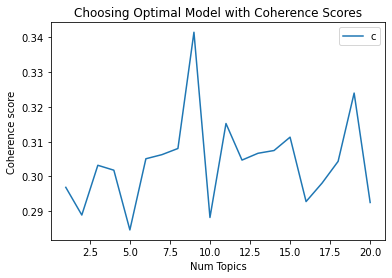

In [161]:
# Show graph
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

limit=21; start=1; step=1;
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.title("Choosing Optimal Model with Coherence Scores")
plt.show()

In [162]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 4))

Num Topics = 1  has Coherence Value of 0.2969
Num Topics = 2  has Coherence Value of 0.2889
Num Topics = 3  has Coherence Value of 0.3032
Num Topics = 4  has Coherence Value of 0.3018
Num Topics = 5  has Coherence Value of 0.2846
Num Topics = 6  has Coherence Value of 0.3051
Num Topics = 7  has Coherence Value of 0.3063
Num Topics = 8  has Coherence Value of 0.3081
Num Topics = 9  has Coherence Value of 0.3415
Num Topics = 10  has Coherence Value of 0.2882
Num Topics = 11  has Coherence Value of 0.3152
Num Topics = 12  has Coherence Value of 0.3047
Num Topics = 13  has Coherence Value of 0.3067
Num Topics = 14  has Coherence Value of 0.3075
Num Topics = 15  has Coherence Value of 0.3113
Num Topics = 16  has Coherence Value of 0.2928
Num Topics = 17  has Coherence Value of 0.2981
Num Topics = 18  has Coherence Value of 0.3044
Num Topics = 19  has Coherence Value of 0.324
Num Topics = 20  has Coherence Value of 0.2925


In [164]:
# supporting function
def compute_coherence_values(corpus, dictionary, k, a, b):
    
    lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=k, 
                                           random_state=100,
                                           chunksize=100,
                                           passes=10,
                                           alpha=a,
                                           eta=b,
                                           per_word_topics=True)
    
    coherence_model_lda = CoherenceModel(model=lda_model, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
    
    return coherence_model_lda.get_coherence()

In [105]:
import numpy as np
import tqdm
grid = {}
grid['Validation_Set'] = {}
# Topics range
min_topics = 2
max_topics = 11
step_size = 1
topics_range = range(min_topics, max_topics, step_size)
# Alpha parameter
alpha = list(np.arange(0.01, 1, 0.3))
alpha.append('symmetric')
alpha.append('asymmetric')
# Beta parameter
beta = list(np.arange(0.01, 1, 0.3))
beta.append('symmetric')
# Validation sets
num_of_docs = len(corpus)
corpus_sets = [#gensim.utils.ClippedCorpus(corpus, num_of_docs*0.25), 
               #gensim.utils.ClippedCorpus(corpus, num_of_docs*0.5), 
               #gensim.utils.ClippedCorpus(corpus, num_of_docs*0.75), 
               corpus]
corpus_title = ['100% Corpus']
model_results = {'Validation_Set': [],
                 'Topics': [],
                 'Alpha': [],
                 'Beta': [],
                 'Coherence': []
                }

In [106]:
# Can take a long time to run
if 1 == 1:
    pbar = tqdm.tqdm(total=540)
    
    # iterate through validation corpuses
    for i in range(len(corpus_sets)):
        # iterate through number of topics
        for k in topics_range:
            # iterate through alpha values
            for a in alpha:
                # iterare through beta values
                for b in beta:
                    # get the coherence score for the given parameters
                    cv = compute_coherence_values(corpus=corpus_sets[i], dictionary=id2word, 
                                                  k=k, a=a, b=b)
                    # Save the model results
                    model_results['Validation_Set'].append(corpus_title[i])
                    model_results['Topics'].append(k)
                    model_results['Alpha'].append(a)
                    model_results['Beta'].append(b)
                    model_results['Coherence'].append(cv)
                    
                    pbar.update(1)
    pd.DataFrame(model_results).to_csv('lda_tuning_results.csv', index=False)
    pbar.close()



  0%|          | 0/540 [00:00<?, ?it/s]

  0%|          | 1/540 [01:00<9:00:21, 60.15s/it]

  0%|          | 2/540 [01:42<8:12:41, 54.95s/it]

  1%|          | 3/540 [02:25<7:37:41, 51.14s/it]

  1%|          | 4/540 [03:04<7:06:13, 47.71s/it]

  1%|          | 5/540 [03:29<6:03:51, 40.81s/it]

  1%|          | 6/540 [03:50<5:08:38, 34.68s/it]

  1%|▏         | 7/540 [04:10<4:30:31, 30.45s/it]

  1%|▏         | 8/540 [04:30<4:01:13, 27.21s/it]

  2%|▏         | 9/540 [04:49<3:39:35, 24.81s/it]

  2%|▏         | 10/540 [05:10<3:30:29, 23.83s/it]

  2%|▏         | 11/540 [05:32<3:23:03, 23.03s/it]

  2%|▏         | 12/540 [05:51<3:12:56, 21.93s/it]

  2%|▏         | 13/540 [06:11<3:06:35, 21.24s/it]

  3%|▎         | 14/540 [06:31<3:02:48, 20.85s/it]

  3%|▎         | 15/540 [06:52<3:02:46, 20.89s/it]

  3%|▎         | 16/540 [07:11<2:59:08, 20.51s/it]

  3%|▎         | 17/540 [07:31<2:56:43, 20.28s/it]

  3%|▎         | 18/540 [07:51<2:55:58, 20.23s/it]

  4%|▎         | 19/540 [08:12

 26%|██▌       | 140/540 [48:52<2:14:14, 20.14s/it]

 26%|██▌       | 141/540 [49:11<2:12:07, 19.87s/it]

 26%|██▋       | 142/540 [49:32<2:12:48, 20.02s/it]

 26%|██▋       | 143/540 [49:52<2:12:35, 20.04s/it]

 27%|██▋       | 144/540 [50:10<2:08:23, 19.45s/it]

 27%|██▋       | 145/540 [50:29<2:07:12, 19.32s/it]

 27%|██▋       | 146/540 [50:49<2:09:14, 19.68s/it]

 27%|██▋       | 147/540 [51:10<2:10:17, 19.89s/it]

 27%|██▋       | 148/540 [51:29<2:08:14, 19.63s/it]

 28%|██▊       | 149/540 [51:47<2:05:58, 19.33s/it]

 28%|██▊       | 150/540 [52:08<2:07:17, 19.58s/it]

 28%|██▊       | 151/540 [52:28<2:09:27, 19.97s/it]

 28%|██▊       | 152/540 [52:47<2:06:45, 19.60s/it]

 28%|██▊       | 153/540 [53:08<2:08:15, 19.89s/it]

 29%|██▊       | 154/540 [53:27<2:07:14, 19.78s/it]

 29%|██▊       | 155/540 [53:48<2:08:23, 20.01s/it]

 29%|██▉       | 156/540 [54:08<2:08:24, 20.06s/it]

 29%|██▉       | 157/540 [54:28<2:07:42, 20.01s/it]

 29%|██▉       | 158/540 [54:49<2:09:02, 20.27

In [201]:
df = pd.read_csv('lda_tuning_results.csv')
df.dtypes

Validation_Set     object
Topics              int64
Alpha              object
Beta               object
Coherence         float64
dtype: object

In [212]:
np.max(df[(df['Topics'] == 9)]['Coherence'].values)

0.4211185082979162

In [199]:
df[(df['Topics'] == 9) & (round(df['Coherence'],6) == 0.421119)][['Alpha','Beta']]

,Alpha,Beta
218,0.31,0.9099999999999999


In [202]:
df[(df['Topics'] == 9)][(round(df['Coherence'],6) == 0.421119)][['Alpha','Beta']]

<ipython-input-202-2c18cd831ff3>:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df[(df['Topics'] == 9)][(round(df['Coherence'],6) == 0.421119)][['Alpha','Beta']]


,Alpha,Beta
218,0.31,0.9099999999999999


# Final Model

In [204]:
lda_model_final = gensim.models.LdaMulticore(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=9, 
                                           random_state=100,
                                           chunksize=100,
                                           passes=10,
                                           alpha=0.31,
                                           eta=0.909)

coherence_model_lda_final = CoherenceModel(model=lda_model_final, texts=data_lemmatized, dictionary=id2word, coherence='c_v')

In [208]:
lda_model_final.log_perplexity(corpus)

-7.213783121134522

In [206]:
coherence_model_lda_final.get_coherence()

0.3940025996161458

In [209]:
# Visualize the topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model_final, corpus, id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
5     -0.191025  0.010423       1        1  50.643559
2     -0.185024 -0.043756       2        1  31.157490
0     -0.069219  0.095007       3        1   7.178483
6     -0.009133 -0.068905       4        1   5.469300
1      0.054148  0.010568       5        1   1.788544
3      0.096560 -0.036136       6        1   1.414649
7      0.097660 -0.013036       7        1   1.214649
4      0.060820  0.031090       8        1   0.858174
8      0.145213  0.014745       9        1   0.275147, topic_info=        Term         Freq        Total Category  logprob  loglift
379     loan   974.000000   974.000000  Default  30.0000  30.0000
1660  market   983.000000   983.000000  Default  29.0000  29.0000
1419     tax  1804.000000  1804.000000  Default  28.0000  28.0000
53      bank  1121.000000  1121.000000  Default  27.0000  27.0000
476   people  2251.000000  2251.000000  Default  26.0000  26.0000
...      ...          ...          ...      ...      ...      ...
86      case     0.608153  1378.325195   Topic9  -7.3858  -1.8303
1125  refund     0.415763    87.228867   Topic9  -7.7661   0.5494
777    claim     0.464818   600.716309   Topic9  -7.6546  -1.2686
419    money     0.509017  3408.214844   Topic9  -7.5637  -2.9136
394     make     0.443599  2400.310303   Topic9  -7.7013  -2.7006

[619 rows x 6 columns], token_table=      Topic      Freq     Term
term                          
1882      1  0.031757  aadhaar
1882      2  0.127029  aadhaar
1882      3  0.031757  aadhaar
1882      4  0.063515  aadhaar
1882      6  0.698662  aadhaar
...     ...       ...      ...
737       4  0.006087     year
737       5  0.002029     year
737       6  0.000676     year
737       7  0.001353     year
737       8  0.000676     year

[2671 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 3, 1, 7, 2, 4, 8, 5, 9])